In [628]:
from IPython.core.display import HTML
display(HTML("""
<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>"""))

In [629]:
from IPython.core.display import HTML
display(HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
"""))

<font size="6"><b>INTRODUCTION TO IMAGE PROCESSING SERIES<b></font>

Submitted by KRISTINE ANN M. CARANDANG | MSDS 2022 | March 2022

In [630]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv
from skimage.color import hsv2rgb
from skimage.color import rgb2gray
from skimage import img_as_uint
from skimage.color import gray2rgb
from skimage import img_as_ubyte
from tqdm import tqdm_notebook
from skimage import img_as_ubyte, img_as_float
from skimage.exposure import histogram, cumulative_distribution
from scipy.stats import norm
from scipy.stats import logistic, gamma, expon, fatiguelife
from skimage.exposure import rescale_intensity
from scipy.signal import convolve2d
from skimage.morphology import dilation, erosion, opening, closing
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.measure import label, regionprops, regionprops_table
from skimage import data, measure
from skimage.filters import threshold_triangle, threshold_yen, threshold_otsu
from math import sqrt
from skimage import transform
from skimage.util import invert
import pandas as pd
import os
import warnings
warnings.filterwarnings("ignore")

from matplotlib.patches import Circle, Rectangle, Polygon
from skimage.feature import match_template
from skimage.feature import peak_local_max

# Image as a Matrix of Numbers

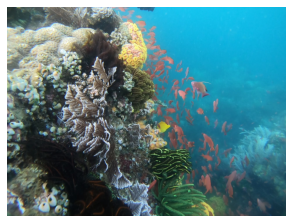

In [631]:
# read image file
sample = imread('sample_images/orange.jpg')

# display image
plt.figure(figsize=(5,5))
plt.imshow(sample)
plt.axis('off');

In [632]:
# array representation
display(sample)

array([[[ 37,  54,  48],
        [ 37,  54,  48],
        [ 37,  54,  48],
        ...,
        [ 18, 181, 222],
        [ 17, 180, 221],
        [ 17, 180, 221]],

       [[ 37,  54,  48],
        [ 37,  54,  48],
        [ 37,  54,  48],
        ...,
        [ 17, 180, 221],
        [ 17, 180, 221],
        [ 16, 179, 220]],

       [[ 37,  54,  48],
        [ 37,  54,  48],
        [ 37,  54,  48],
        ...,
        [ 17, 180, 221],
        [ 17, 180, 221],
        [ 16, 179, 220]],

       ...,

       [[ 75, 112,  94],
        [ 75, 112,  94],
        [ 73, 110,  92],
        ...,
        [ 24,  63,  68],
        [ 24,  63,  68],
        [ 24,  63,  68]],

       [[ 76, 110,  93],
        [ 76, 110,  93],
        [ 72, 109,  91],
        ...,
        [ 24,  63,  68],
        [ 24,  63,  68],
        [ 23,  62,  67]],

       [[ 76, 110,  93],
        [ 76, 110,  93],
        [ 72, 109,  91],
        ...,
        [ 24,  63,  68],
        [ 24,  63,  68],
        [ 23,  62,  67]]

# Image Type Conversions

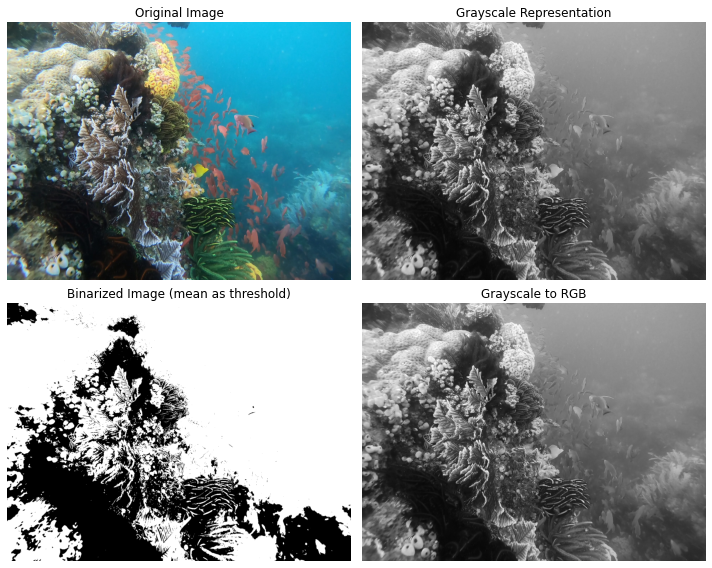

In [633]:
fig, ax = plt.subplots(2,2, figsize=(10, 8))

# converting original image to grayscale representation
sample_gray = rgb2gray(sample)

# binarization using average value as theshold
# sample_binary = img_as_uint(sample_gray > sample_gray.mean())
sample_binary = img_as_uint(sample_gray > 0.3)

ax[0,0].imshow(sample)
ax[0,0].set_title('Original Image')
ax[0,0].axis('off')
ax[0,1].imshow(sample_gray, cmap='gray')
ax[0,1].set_title('Grayscale Representation')
ax[0,1].axis('off')
ax[1,0].imshow(sample_binary, cmap='gray')
ax[1,0].set_title('Binarized Image (mean as threshold)')
ax[1,0].axis('off')


ax[1,1].imshow(gray2rgb(sample_gray))
ax[1,1].set_title('Grayscale to RGB')
ax[1,1].axis('off')

plt.tight_layout();

# Color spaces

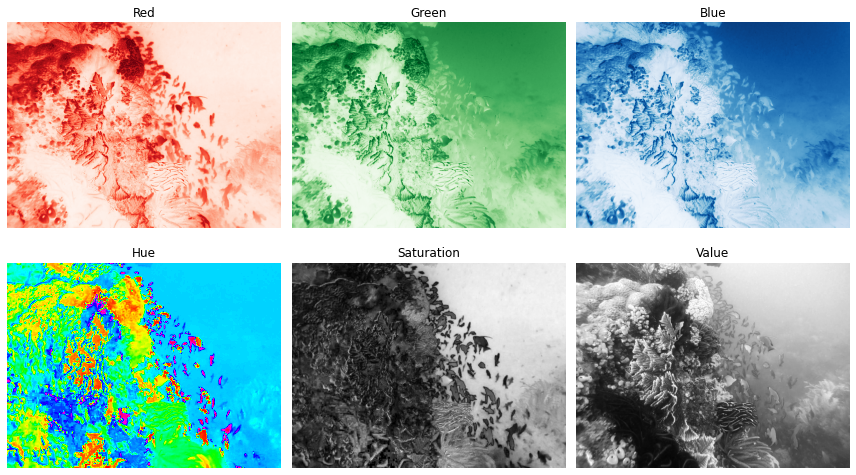

In [634]:
fig, ax = plt.subplots(2, 3, figsize=(12,7))

# RGB
ax[0, 0].imshow(sample[:,:,0], cmap='Reds')
ax[0, 0].axis('off')
ax[0, 0].set_title('Red')
ax[0, 1].imshow(sample[:,:,1], cmap='Greens')
ax[0, 1].axis('off')
ax[0, 1].set_title('Green')
ax[0, 2].imshow(sample[:,:,2], cmap='Blues')
ax[0, 2].axis('off')
ax[0, 2].set_title('Blue');

# HSV
from skimage.color import rgb2hsv
sample_hsv = rgb2hsv(sample)
ax[1, 0].imshow(sample_hsv[:,:,0], cmap='hsv')
ax[1, 0].axis('off')
ax[1, 0].set_title('Hue')
ax[1, 1].imshow(sample_hsv[:,:,1], cmap='gray')
ax[1, 1].axis('off')
ax[1, 1].set_title('Saturation')
ax[1, 2].imshow(sample_hsv[:,:,2], cmap='gray')
ax[1, 2].set_title('Value');
ax[1, 2].axis('off')
plt.tight_layout();

# Image Enhancement

In [635]:
def ground_truth(image, patch, mode='mean'):
    """White balance image using Ground-truth algorithm

    Parameters
    ----------
    image : numpy array
        Image to white balance
    patch : numpy array
        Patch of "true" white
    mode : mean or max, optional
        Adjust mean or max of each channel to match patch

    Returns
    -------
    image_wb : numpy array
        White-balanced image
    """
    if mode == 'mean':
        img = (image*1.0 / patch.mean(axis=(0, 1))).clip(0, 1)
    elif mode == 'max':
        img = (image*1.0 / patch.max(axis=(0, 1))).clip(0, 1)
    return img


def white_patch(image, percentile=100):
    """White balance image using White patch algorithm
    
    Parameters
    ----------
    image : numpy array
        Image to white balance
    percentile : integer, optional
        Percentile value to consider as channel maximum
        
    Returns
    -------
    image_wb : numpy array
        White-balanced image
    """
    img_wp= img_as_ubyte((image*1.0 /
                          np.percentile(image, percentile, axis=(0, 1)))
                          .clip(0, 1))
    return img_wp


def gray_world(image):
    """White balance image using Gray-world algorithm

    Parameters
    ----------
    image : numpy array
        Image to white balance

    Returns
    -------
    image_wb : numpy array
        White-balanced image
    """
    img_gw = ((image * (image.mean() / image.mean(axis=(0, 1))))
             .clip(0, 255).astype(int))
    return img_gw


def equalize_rgb(filepath, equalizer, fig_title):
    """Perform histogram manipulation
    """
    # read image, set variables
    dark_image = imread(filepath)
    red_dark_image = imread(filepath)
    green_dark_image = imread(filepath)
    blue_dark_image = imread(filepath)
    red = dark_image[:,:,0]
    green = dark_image[:,:,1]
    blue = dark_image[:,:,2]
    images = [dark_image, red, green, blue]
    image_labels = ['dark_image', 'red', 'green', 'blue']
    colors = ['Reds', 'Greens', 'Blues']

    # plot the dark image and its representation in each RGB channel
    fig, ax = plt.subplots(4, 4, figsize=(15,12))
    plt.suptitle(fig_title, weight='bold', fontsize=14)
    for i in range(0, 4):
        freq, bins = cumulative_distribution(images[i])    
        if equalizer == 'linear':
            target_bins = np.arange(255)
            target_freq = np.linspace(0, 1, len(target_bins))
            new_vals = np.interp(freq, target_freq, target_bins)
            a = img_as_ubyte(new_vals[images[i]].astype(int))
        else:
            new_vals = np.interp(freq,
                                 equalizer.cdf(np.arange(0,255)),
                                 np.arange(0,255))
            a = img_as_ubyte(new_vals[images[i]].astype(int))
        if i > 0:
            ax[0,i].imshow(images[i], cmap=colors[i-1])
            ax[0,i].set_title(f'Original {colors[i-1][:-1]} Channel')
            ax[0,i].axis('off')
            ax[1,i].imshow(a, cmap=colors[i-1])
            ax[1,i].axis('off')
            ax[1,i].set_title(f'Enhanced {colors[i-1][:-1]} Channel')
        else:
            ax[0,i].imshow(images[i])
            ax[0,i].set_title('Original Image')
            ax[0,i].axis('off')
            ax[1,i].imshow(a)
            ax[1,i].axis('off')
            ax[1,i].set_title('Enhanced Image')
        if image_labels[i] == 'red':
            red_dark_image[:,:,0] = a
            ax[2,i].imshow(red_dark_image)
            ax[2,i].axis('off')
            ax[2,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')
            freq, bins = histogram(red_dark_image)
            ax[3,i].step(bins, freq*1.0/freq.sum())
            ax[3,i].set_xlabel('intensity value')
            ax[3,i].set_ylabel('fraction of pixels')
        elif image_labels[i] == 'green':
            green_dark_image[:,:,1] = a
            ax[2,i].imshow(green_dark_image)
            ax[2,i].axis('off')
            ax[2,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')        
            freq, bins = histogram(green_dark_image)
            ax[3,i].step(bins, freq*1.0/freq.sum())
            ax[3,i].set_xlabel('intensity value')
            ax[3,i].set_ylabel('fraction of pixels')
        elif image_labels[i] == 'blue':
            blue_dark_image[:,:,2] = a
            ax[2,i].imshow(blue_dark_image)
            ax[2,i].axis('off')
            ax[2,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')
            freq, bins = histogram(blue_dark_image)
            ax[3,i].step(bins, freq*1.0/freq.sum())
            ax[3,i].set_xlabel('intensity value')
            ax[3,i].set_ylabel('fraction of pixels')
        else:
            ax[2,i].imshow(a)
            ax[2,i].axis('off')
            freq, bins = histogram(a)
            ax[3,i].step(bins, freq*1.0/freq.sum())
            ax[3,i].set_xlabel('intensity value')
            ax[3,i].set_ylabel('fraction of pixels')
    plt.tight_layout();

## White Balancing

### Ground Truth

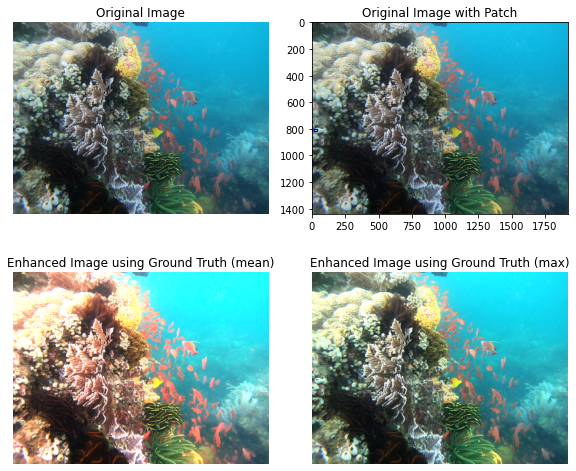

In [636]:
# plot the baseline
fig, ax = plt.subplots(2, 2, figsize=(8,7))
# plt.suptitle('Figure 1. Underwater Photo\n',
#              weight='bold', fontsize=14)
ax[0, 0].imshow(sample)
ax[0, 0].axis('off')
ax[0, 0].set_title('Original Image')

# create patches for the ground truth and plot these over the image
ax[0, 1].imshow(sample)
ax[0, 1].add_patch(Rectangle((15, 800), 20, 20, edgecolor='b', facecolor='none'));
ax[0, 1].set_title('Original Image with Patch')
patch = sample[15:65, 800:850]
ax[1, 0].imshow(ground_truth(sample, patch, mode='mean'))
ax[1, 0].set_title('Enhanced Image using Ground Truth (mean)')
ax[1, 0].axis('off')
ax[1, 1].imshow(ground_truth(sample, patch, mode='max'))
ax[1, 1].set_title('Enhanced Image using Ground Truth (max)')
ax[1, 1].axis('off')

plt.tight_layout()

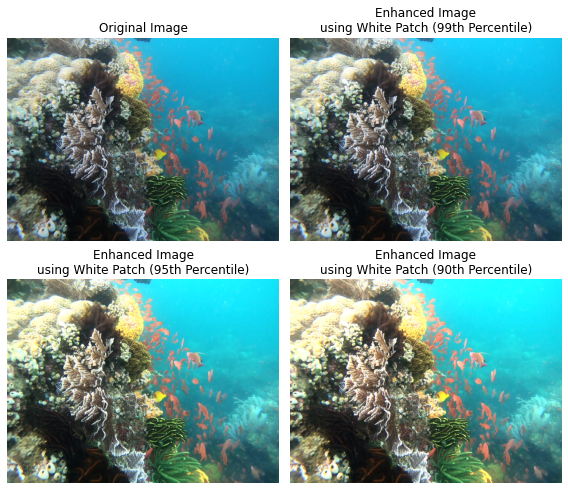

In [637]:
# plot the images showing the application of white patch
percentiles = [100, 99, 95, 90]
fig, ax = plt.subplots(2, 2, figsize=(8,7))
for i in range(0, 4):
    if i < 2:
        j = 0
        k = i
    else:
        j = 1
        k = i -2
    a = white_patch(sample, percentiles[i])
    ax[j, k].imshow(a)
    ax[j, k].set_title(f'Enhanced Image\nusing White Patch ({percentiles[i]}th Percentile)')
    ax[j, k].axis('off')
ax[0,0].set_title('Original Image')
plt.tight_layout()

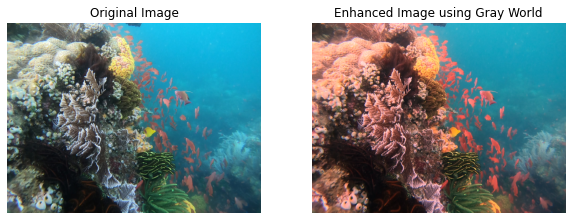

In [638]:
# plot the images showing the application of white patch
fig, ax = plt.subplots(1, 2, figsize=(10,4.5))
ax[0].imshow(sample)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(gray_world(sample));
ax[1].set_title('Enhanced Image using Gray World')
ax[1].axis('off');

## Histogram Manipulation

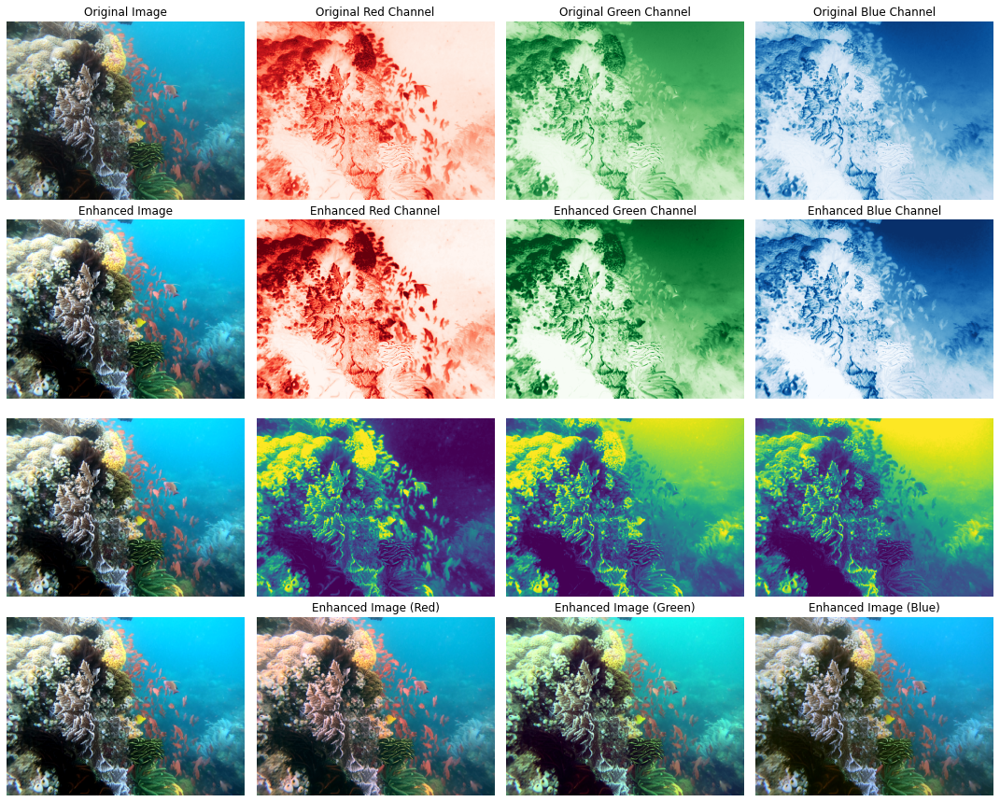

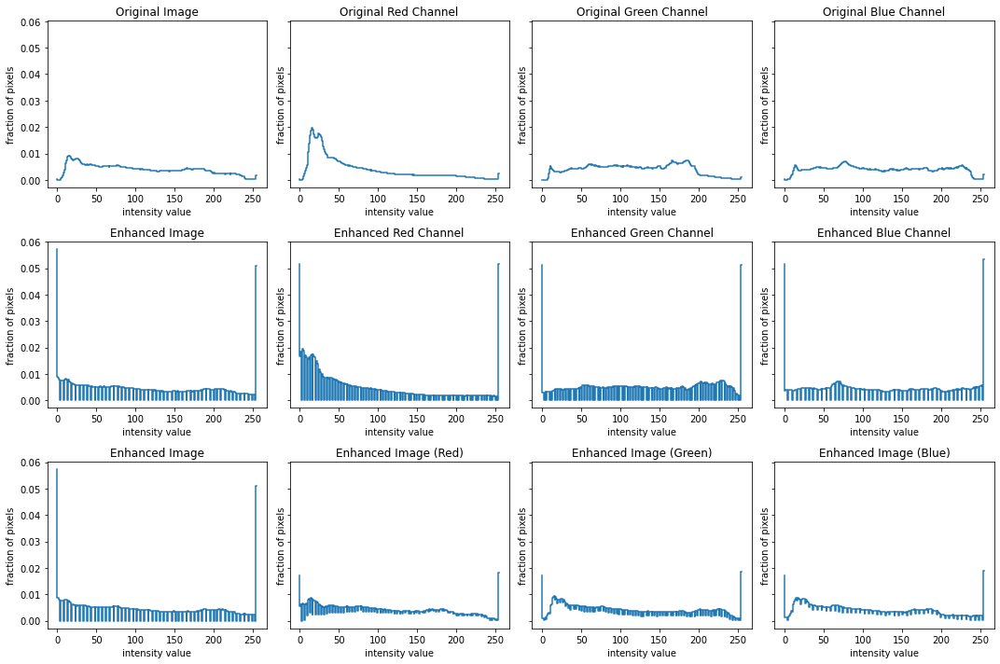

In [639]:
# read image, set variables
filepath = 'sample_images/orange.jpg'
dark_image = imread(filepath)
red_dark_image = imread(filepath)
green_dark_image = imread(filepath)
blue_dark_image = imread(filepath)
red = dark_image[:,:,0]
green = dark_image[:,:,1]
blue = dark_image[:,:,2]
images = [dark_image, red, green, blue]
image_labels = ['dark_image', 'red', 'green', 'blue']
colors = ['Reds', 'Greens', 'Blues']

# plot the dark image and its representation in each RGB channel
fig, ax = plt.subplots(4, 4, figsize=(15,12))
for i in range(0, 4):
    a = rescale_intensity(images[i],
                          in_range=tuple(np.percentile(images[i], (5,95))))
    if i > 0:
        ax[0,i].imshow(images[i], cmap=colors[i-1])
        ax[0,i].set_title(f'Original {colors[i-1][:-1]} Channel')
        ax[0,i].axis('off')
        ax[1,i].imshow(a, cmap=colors[i-1])
        ax[1,i].axis('off')
        ax[1,i].set_title(f'Enhanced {colors[i-1][:-1]} Channel')
    else:
        ax[0,i].imshow(images[i])
        ax[0,i].set_title('Original Image')
        ax[0,i].axis('off')
        ax[1,i].imshow(a)
        ax[1,i].axis('off')
        ax[1,i].set_title('Enhanced Image')
    ax[2,i].imshow(a)
    ax[2,i].axis('off')
    if image_labels[i] == 'red':
        red_dark_image[:,:,0] = a
        ax[3,i].imshow(red_dark_image)
        ax[3,i].axis('off')
        ax[3,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')

    elif image_labels[i] == 'green':
        green_dark_image[:,:,1] = a
        ax[3,i].imshow(green_dark_image)
        ax[3,i].axis('off')
        ax[3,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')        

    elif image_labels[i] == 'blue':
        blue_dark_image[:,:,2] = a
        ax[3,i].imshow(blue_dark_image)
        ax[3,i].axis('off')
        ax[3,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')

    else:
        ax[3,i].imshow(a)
        ax[3,i].axis('off')
plt.tight_layout();

# plot the histograms
fig, ax = plt.subplots(3, 4, figsize=(15,10), sharey=True)
for i in range(0, 4):
    a = rescale_intensity(images[i],
                          in_range=tuple(np.percentile(images[i], (5, 95))))
    
    # histogram of original image
    freq, bins = histogram(images[i])
    ax[0,i].step(bins, freq*1.0/freq.sum())
    ax[0,i].set_xlabel('intensity value')
    ax[0,i].set_ylabel('fraction of pixels')
    
    # histogram after rescale intensity was applied
    freq, bins = histogram(a)
    ax[1,i].step(bins, freq*1.0/freq.sum())
    ax[1,i].set_xlabel('intensity value')
    ax[1,i].set_ylabel('fraction of pixels')
    if i == 0:
        freq, bins = histogram(a)
        ax[2,0].step(bins, freq*1.0/freq.sum())
        ax[2,0].set_xlabel('intensity value')
        ax[2,0].set_ylabel('fraction of pixels')

    if i > 0:
        ax[0,i].set_title(f'Original {colors[i-1][:-1]} Channel')
        ax[1,i].set_title(f'Enhanced {colors[i-1][:-1]} Channel')
        ax[2,i].set_title(f'Enhanced Image ({colors[i-1][:-1]})')
    else:
        ax[0,i].set_title('Original Image')
        ax[1,i].set_title('Enhanced Image')
        ax[2,i].set_title('Enhanced Image')

# histogram of image after rescale intensity was applied
freq, bins = histogram(red_dark_image)
ax[2,1].step(bins, freq*1.0/freq.sum())
ax[2,1].set_xlabel('intensity value')
ax[2,1].set_ylabel('fraction of pixels')
freq, bins = histogram(green_dark_image)
ax[2,2].step(bins, freq*1.0/freq.sum())
ax[2,2].set_xlabel('intensity value')
ax[2,2].set_ylabel('fraction of pixels')
freq, bins = histogram(blue_dark_image)
ax[2,3].step(bins, freq*1.0/freq.sum())
ax[2,3].set_xlabel('intensity value')
ax[2,3].set_ylabel('fraction of pixels')
plt.tight_layout();

# Spatial Filtering

In [640]:
# Left Diagonal Filter
left_diagonal = np.array([[1, -1, -1],
                    [-1, 1, -1],
                    [-1, -1, 1]])


# Right Diagonal Filter
right_diagonal = np.array([[-1, -1, 1],
                    [-1, 1, -1],
                    [1, -1, -1]])

# Edge Detection
edge = np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])

# Sharpen
sharpen = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

# Box Blur
box_blur = (1 / 9.0) * np.array([[1., 1., 1.],
                                [1., 1., 1.],
                                [1., 1., 1.]])

# Point Blur
box_blur = (1 / 9.0) * np.array([[1., 1., 1.],
                                [1., 8., 1.],
                                [1., 1., 1.]])

# Gaussian Blur
gaussian_blur = (1 / 16.0) * np.array([[1., 2., 1.],
                                 [2., 4., 2.],
                                 [1., 2., 1.]])


In [641]:
def plot_filters():
    """Plot the filters"""
    kernels = [left_diagonal, right_diagonal,
               edge, sharpen,
               box_blur, gaussian_blur]

    kernel_labels =['left_diagonal', 'right_diagonal',
                    'edge', 'sharpen',
                    'box_blur', 'gaussian_blur']

    fig, ax = plt.subplots(2,3, figsize=(15,8))
    #     fig.suptitle('Comparison of Filters\n')
    for i in range(len(kernels)):
        if i <= 2:
            j = 0
            k = i
        elif (i > 2) & (i < 6):
            j = 1
            k = i - 3
        else:
            j = 2
            k = i - 6
        ax[j,k].imshow(kernels[i], cmap='gray')
        ax[j,k].set_xticks([]);
        ax[j,k].set_yticks([]);
        ax[j,k].set_title(kernel_labels[i], weight='bold')
    plt.tight_layout()
    

def apply_filters(image):
    """Show the filtered images"""
    kernels = [left_diagonal, right_diagonal,
               edge, sharpen,
               box_blur, gaussian_blur]

    kernel_labels =['left_diagonal', 'right_diagonal',
                    'edge', 'sharpen',
                    'box_blur', 'gaussian_blur']

    fig, ax = plt.subplots(2,3, figsize=(15,8))
    #     fig.suptitle('Comparison of Filters\n')
    for i in range(len(kernels)):
        if i <= 2:
            j = 0
            k = i
        elif (i > 2) & (i < 6):
            j = 1
            k = i - 3
        else:
            j = 2
            k = i - 6
        conv_im1 = convolve2d(image, kernels[i], 'valid')
        ax[j,k].imshow(abs(conv_im1), cmap='gray')
        ax[j,k].set_xticks([]);
        ax[j,k].set_yticks([]);
        ax[j,k].set_title(kernel_labels[i], weight='bold')
    plt.tight_layout()

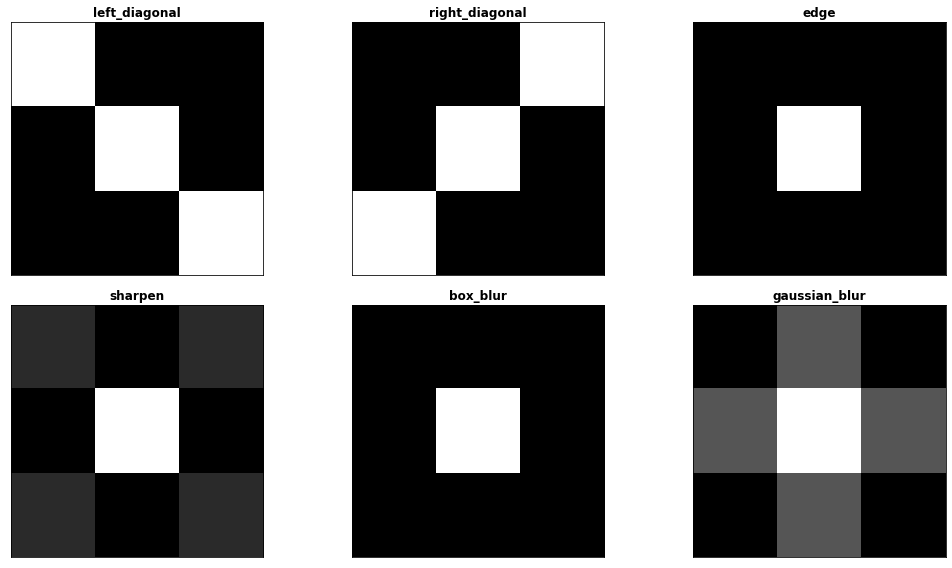

In [642]:
# show the structure of the filters
plot_filters()

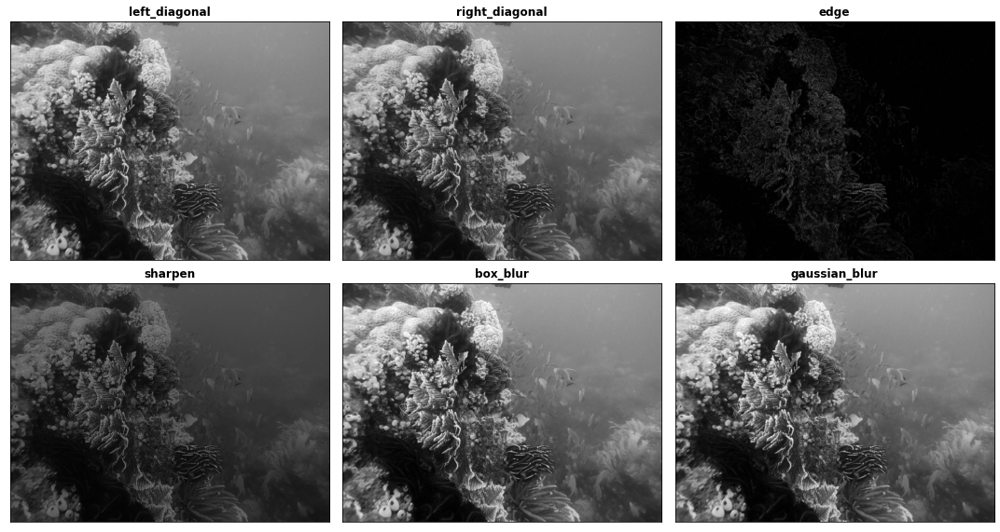

In [643]:
# apply filters to image
apply_filters(rgb2gray(sample))

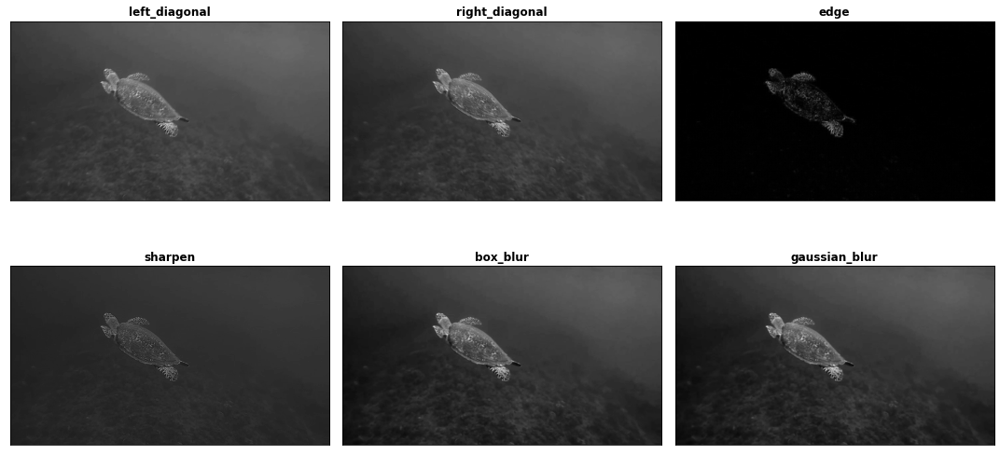

In [644]:
# apply filters to image
sample2 = imread('sample_images/pawikan-1.jpg')
apply_filters(rgb2gray(sample2))

# Blob Detection and Connected Components Labelling

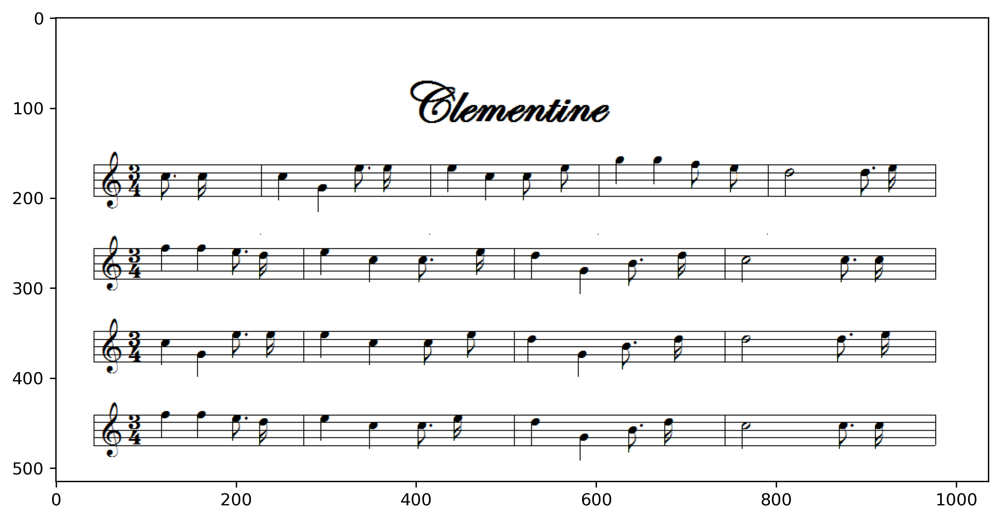

In [645]:
from skimage import data, io, filters
import matplotlib.pyplot as plt
# read and display music sheet
music_sheet = io.imread('clementine.PNG')
fig, ax = plt.subplots(figsize=(10,10),dpi=300)
ax.imshow(music_sheet,cmap='gray');

## Identifying the pitch

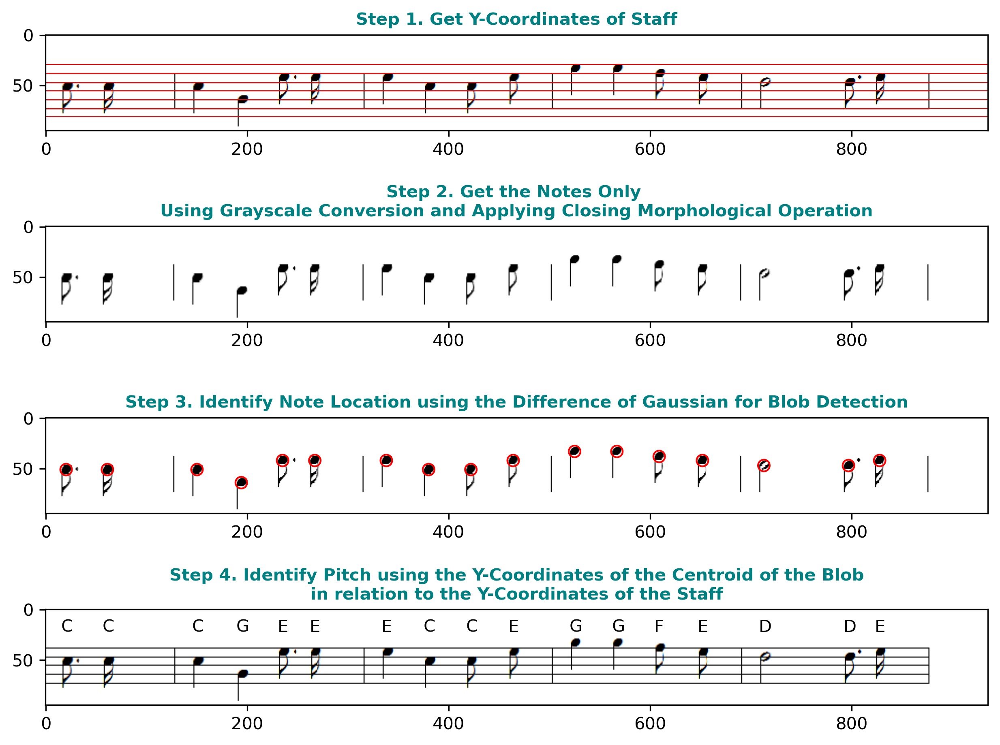

In [646]:
# get first line of music sheet
line1 = music_sheet[125:220, 100:]

fig, ax = plt.subplots(4, 1, figsize=(10,8),dpi=300)

# check y-coordinate of staff for first line
ax[0].imshow(line1);
ax[0].axhline(81, linewidth=0.5, color='red')
ax[0].axhline(73, linewidth=0.5, color='red')
ax[0].axhline(64, linewidth=0.5, color='red')
ax[0].axhline(55, linewidth=0.5, color='red')
ax[0].axhline(47, linewidth=0.5, color='red')
ax[0].axhline(38, linewidth=0.5, color='red')
ax[0].axhline(29, linewidth=0.5, color='red')
ax[0].set_title('Step 1. Get Y-Coordinates of Staff',
                weight='bold', fontsize=10, color='teal');

# get notes only
selem = np.array([[0,1],[0,1]])
notes = closing(rgb2gray(line1), selem)
ax[1].imshow(notes, cmap='gray')
ax[1].set_title('Step 2. Get the Notes Only \nUsing Grayscale Conversion '
                'and Applying Closing Morphological Operation',
                weight='bold', fontsize=10, color='teal');

# identify location of notes to get pitch # 6, 1, 0.5
blobs = blob_dog(invert(notes), max_sigma=6, min_sigma=1, threshold=0.5)
ax[2].imshow(notes, cmap='gray')
for blob in blobs:
    y, x, area = blob
    ax[2].add_patch(plt.Circle((x, y), area*np.sqrt(2), color='red', 
                            fill=False));
ax[2].set_title('Step 3. Identify Note Location using the Difference of'
                ' Gaussian for Blob Detection',
                weight='bold', fontsize=10, color='teal')
    
# manually tag pitch based on centroid location of blob
def identify_pitch(blob):
    """Return pitch based on centroid of blob."""
    y, x, area = blob
    if y == 81:
        pitch = 'C'
    elif y == 73:
        pitch = 'E'
    elif y == 64:
        pitch = 'G'
    elif y == 55:
        pitch = 'B'
    elif y == 47:
        pitch = 'D'
    elif y == 38:
        pitch = 'F'
    elif y == 29:
        pitch = 'A'
    elif y in range(73,81):
        pitch = 'D'
    elif y in range(64,73):
        pitch = 'F'
    elif y in range(55,64):
        pitch = 'A'
    elif y in range(47,64):
        pitch = 'C'
    elif y in range(38,47):
        pitch = 'E'
    elif y in range(29,38):
        pitch = 'G'
    return pitch

# annotate the identified pitches to the sheet
ax[3].imshow(line1);
for blob in blobs:
    y, x, area = blob
    note_pitch = identify_pitch(blob)
    ax[3].text(x-5, 22, note_pitch, color='black');
ax[3].set_title('Step 4. Identify Pitch using the Y-Coordinates '
                'of the Centroid of the Blob\nin relation to '
                'the Y-Coordinates of the Staff',
                weight='bold', fontsize=10, color='teal');

## Identifying the Beat

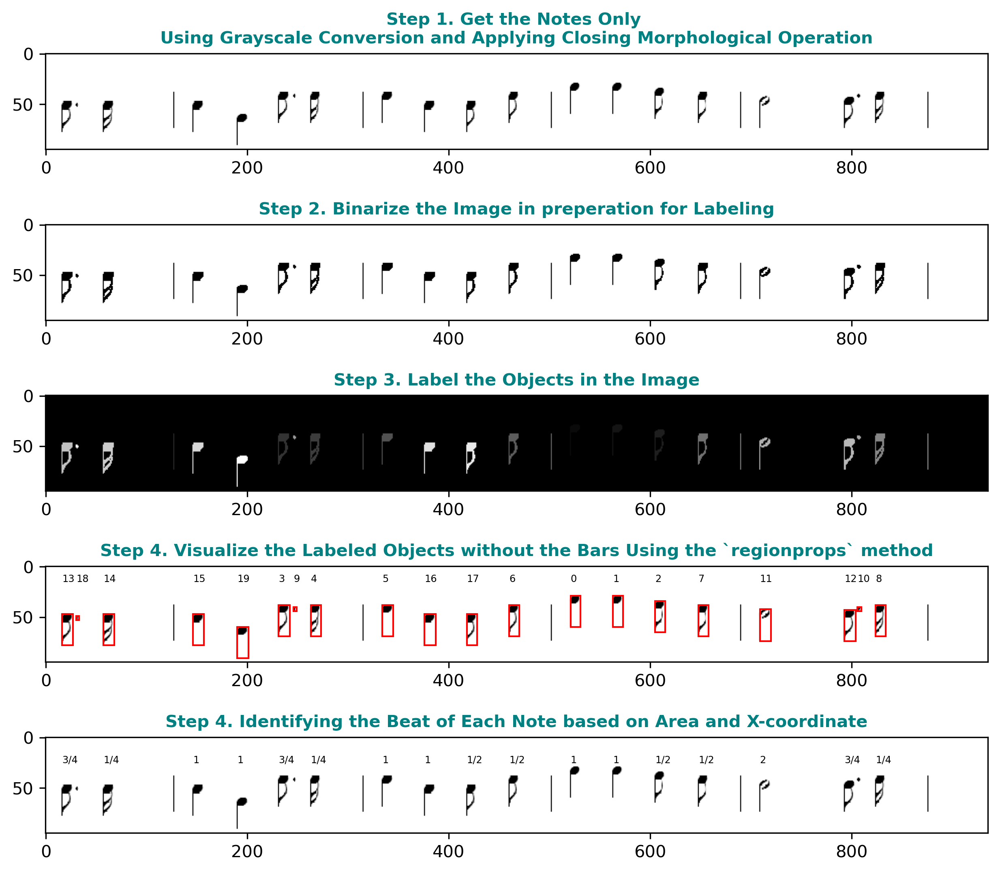

In [647]:
# get first line of music sheet
line1 = music_sheet[125:220, 100:]

fig, ax = plt.subplots(5, 1, figsize=(10,9), dpi=300)

# get notes only
selem = np.array([[0,1],[0,1]])
notes = closing(rgb2gray(line1), selem)
ax[0].imshow(notes, cmap='gray')
ax[0].set_title('Step 1. Get the Notes Only \nUsing Grayscale Conversion '
                'and Applying Closing Morphological Operation',
                weight='bold', fontsize=10, color='teal');
# binarize the image
binary = img_as_uint(notes > notes.mean())
ax[1].imshow(binary, cmap='gray');
ax[1].set_title('Step 2. Binarize the Image in preperation for Labeling',
                weight='bold', fontsize=10, color='teal')

# label the objects in the image
labelled = label(invert(binary))
ax[2].imshow(labelled, cmap='gray');
ax[2].set_title('Step 3. Label the Objects in the Image',
                weight='bold', fontsize=10, color='teal');

# visualize the labeled objects in the image without the bars
props = regionprops(labelled)
ax[3].imshow(notes, cmap='gray')
c = 0
for prop in props:
    if prop.area != 36:
        y0, x0, y1, x1 = prop.bbox
        width = x1-x0
        height = y1-y0
        rectangle = plt.Rectangle((x0,y0),
                                  width=width,
                                  height=height,
                                  color='r', fill=False)
        ax[3].add_patch(rectangle)
        ax[3].text(x0,15, s=f'{c}', size='xx-small')
        c+=1
ax[3].set_title('Step 4. Visualize the Labeled Objects without the Bars'
                ' Using the `regionprops` method',
                weight='bold', fontsize=10, color='teal');


# ###################
# label the beats
# ###################

def identify_beats(props):
    # manually tag the beats based on properties
    properties = pd.DataFrame()
    areas = []
    beats = []
    x1c = []
    x2c = []
    ids = []
    c = 0
    for prop in props:
        area =prop.area
        y0, x0, y1, x1 = prop.bbox
        if area != 36:
            # half note
            if area == 88:
                beat = 2
            # quarter note
            elif area in range(91, 111):
                beat = 1
            # eighth note
            elif area in range(137,166):
                beat = 0.5
            # sixteenth note
            elif area >= 172:
                beat = 0.25
            else:
                beat = 0
            beats.append(beat)
            areas.append(area)
            x1c.append(x0)
            x2c.append(x1)
            ids.append(c)
        c += 1
    properties['id'] = ids
    properties['area'] = areas
    properties['beat'] = beats
    properties['x1'] = x1c
    properties['x2'] = x2c

    # change beat value if dotted
    n = list(range(properties.shape[0]))
    for a in n:
        x1 = properties['x2'].iloc[a]
        for b in n:
            x2 = properties['x1'].iloc[b]
            diff = x2 - x1
            if diff == 0:
                pass
            elif diff in range(1,5):
                properties.at[a, 'dotted'] = 'yes'
    final = []
    for a in n:
        if properties.dotted.iloc[a] == 'yes':
            fin = properties.beat.iloc[a] + (properties.beat.iloc[a] / 2)
        else:
            fin = properties.beat.iloc[a]
        final.append(fin)
    properties['fin'] = final

    # change integer values to string
    values = ['2', '1', '3/4', '1/2', '1/4', ' ']
    conditions = [(properties.fin == 2.0),
                  (properties.fin == 1.0),
                  (properties.fin == 0.75),
                  (properties.fin == 0.5),
                  (properties.fin == 0.25),
                  (properties.fin == 0.0),]
    properties['final_beat'] = np.select(conditions, values)
    
    return properties

properties = identify_beats(props)

# plot/append beats to sheet
ax[4].imshow(notes, cmap='gray')
c = 0
for prop in props:
    if prop.area != 36:
        y0, x0, y1, x1 = prop.bbox
        width = x1-x0
        height = y1-y0
        ax[4].text(x0,25,
                s=properties[properties.id == c].final_beat.values[0],
                size='xx-small')
    c+=1
ax[4].set_title('Step 4. Identifying the Beat of Each Note '
                'based on Area and X-coordinate',
                weight='bold', fontsize=10, color='teal');

## Appending Both Pitch & Beat

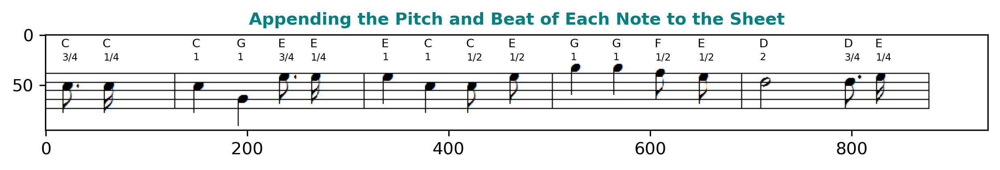

In [648]:
fig, ax = plt.subplots(figsize=(10,2), dpi=300)
ax.set_title('Appending the Pitch and Beat of Each Note to the Sheet',
                weight='bold', fontsize=10, color='teal');

# plot first line of music sheet
line1 = music_sheet[125:220, 100:]
ax.imshow(line1);

# plot/append pitches to sheet
selem = np.array([[0,1],[0,1]])
notes = closing(rgb2gray(line1), selem)
blobs = blob_dog(invert(notes), max_sigma=6, min_sigma=1, threshold=0.5)
for blob in blobs:
    y, x, area = blob
    note_pitch = identify_pitch(blob)
    ax.text(x-5, 12, note_pitch, color='black', fontsize='x-small');

# plot/append beats to sheet
binary = img_as_uint(notes > notes.mean())
labelled = label(invert(binary))
props = regionprops(labelled)
properties = identify_beats(props)
c = 0
for prop in props:
    if prop.area != 36:
        y0, x0, y1, x1 = prop.bbox
        width = x1-x0
        height = y1-y0
        ax.text(x0,25,
                s=properties[properties.id == c].final_beat.values[0],
                size='xx-small')
    c+=1

# Image segmentation

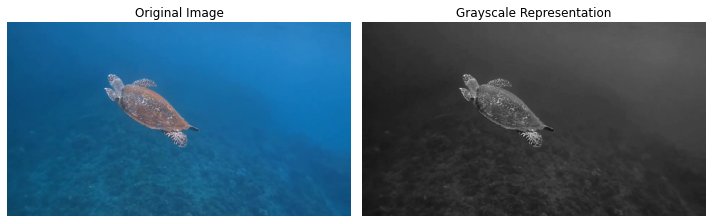

In [649]:
# convert to grayscale
fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(sample2)
ax[0].set_title('Original Image')
ax[1].imshow(rgb2gray(sample2), cmap='gray')
ax[1].set_title('Grayscale Representation')
ax[0].axis('off')
ax[1].axis('off')
plt.tight_layout()

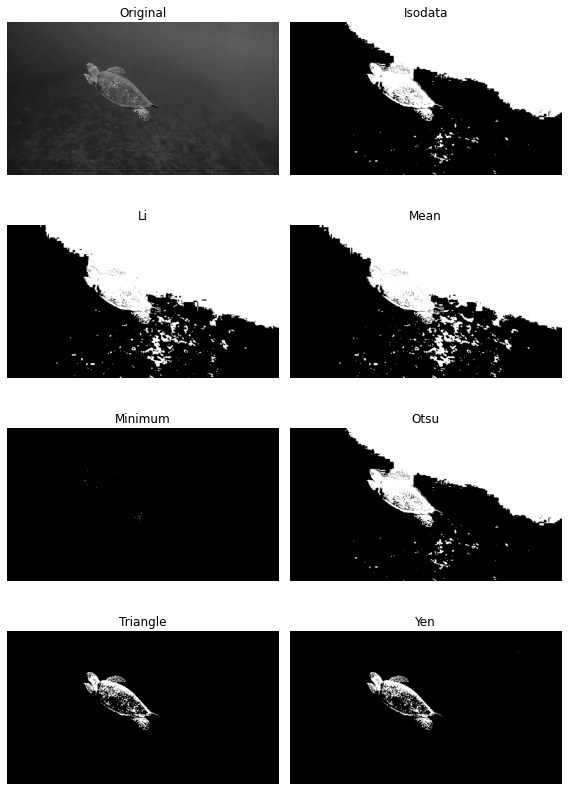

In [650]:
# apply all threshold algorithms
from skimage.filters import try_all_threshold
fig, ax = try_all_threshold(rgb2gray(sample2), figsize=(8, 12), verbose=False)
plt.tight_layout()
plt.show()

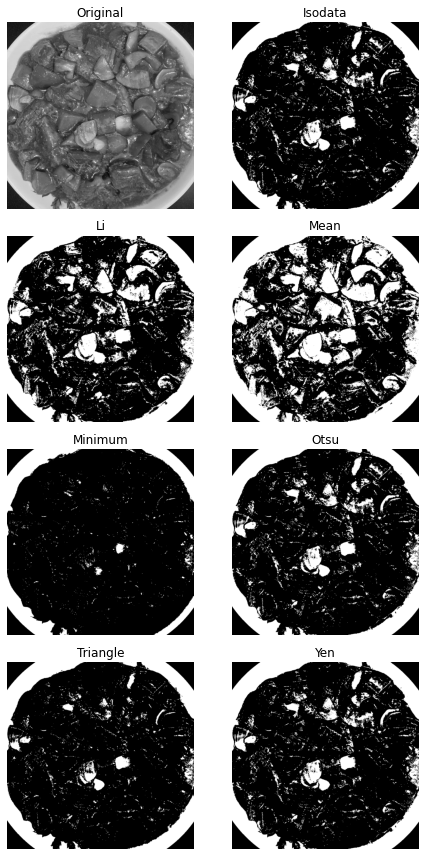

In [651]:
# apply all threshold algorithms
sample3 = imread('sample_images/beef_stew.jpg')
fig, ax = try_all_threshold(rgb2gray(sample3), figsize=(8, 12), verbose=False)
plt.tight_layout()
plt.show()

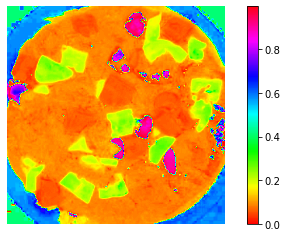

In [652]:
# display hue representation
from skimage import img_as_uint
sample3_hsv = rgb2hsv(sample3)
fig, ax = plt.subplots(figsize=(8,4))
plt.imshow((sample3_hsv[:,:,0]), cmap='hsv')
plt.axis('off')
plt.colorbar();

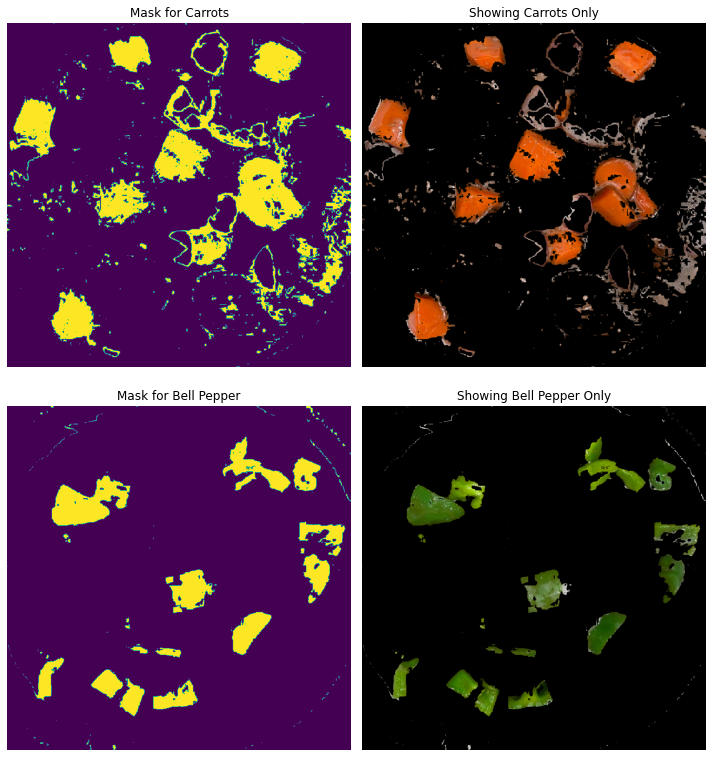

In [653]:
fig, ax = plt.subplots(2, 2, figsize=(10,12))

# segment the carrots
lower_mask = sample3_hsv[:,:,0] > 0
upper_mask = sample3_hsv[:,:,0] < 0.07
grapes_mask = upper_mask*lower_mask
ax[0, 0].imshow(grapes_mask)
ax[0, 0].set_title('Mask for Carrots')
red = sample3[:,:,0]*grapes_mask
green = sample3[:,:,1]*grapes_mask
blue = sample3[:,:,2]*grapes_mask
grapes = np.dstack((red,green,blue))
ax[0, 1].imshow(grapes)
ax[0, 1].set_title('Showing Carrots Only')
ax[0, 0].axis('off')
ax[0, 1].axis('off')
plt.tight_layout()

# segment the bell peppers
lower_mask = sample3_hsv[:,:,0] > 0.2
upper_mask = sample3_hsv[:,:,0] < 0.3
grapes_mask = upper_mask*lower_mask
ax[1, 0].imshow(grapes_mask)
ax[1, 0].set_title('Mask for Bell Pepper')
red = sample3[:,:,0]*grapes_mask
green = sample3[:,:,1]*grapes_mask
blue = sample3[:,:,2]*grapes_mask
grapes = np.dstack((red,green,blue))
ax[1, 1].imshow(grapes)
ax[1, 1].set_title('Showing Bell Pepper Only')
ax[1, 0].axis('off')
ax[1, 1].axis('off')
plt.tight_layout()

# Homography Matrix

In [654]:
# read sample image
sample4 = imread('sample_images/wall.jpg')

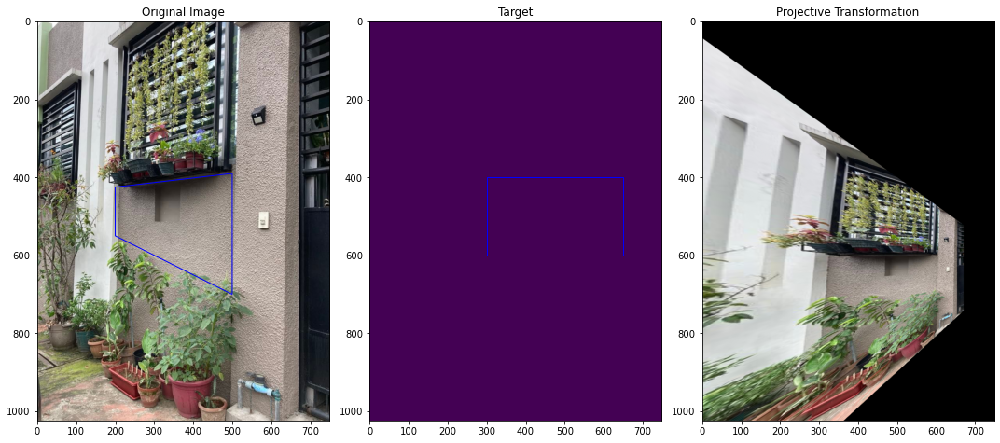

In [664]:
# transform the image
fig, ax = plt.subplots(1, 3, figsize=(15,12))
ax[0].imshow(sample4)
x = [500,200,200,500]
y = [390,425,550,700]
ax[0].add_patch(Polygon(xy=list(zip(x,y)), fill=False, edgecolor='blue'))
ax[0].set_title('Original Image')
x = [650,300,300,650]
y = [400,400,600,600]
ax[1].imshow(np.zeros((sample4.shape[0], sample4.shape[1])))
ax[1].add_patch(Polygon(xy=list(zip(x,y)), fill=False, edgecolor='blue'))
ax[1].set_title('Target')
plt.tight_layout()

src = np.array([[200, 425,
                500, 390,
                 500, 700,
                 200, 550
                ]]).reshape((4,2))
dst = np.array([[300, 600,
                600,600,
                600,700,
                300,700]]).reshape((4,2))

tform = transform.estimate_transform('projective', src, dst)
tf_img = transform.warp(sample4, tform.inverse)
ax[2].imshow(tf_img)
ax[2].set_title('Projective Transformation')
plt.tight_layout()

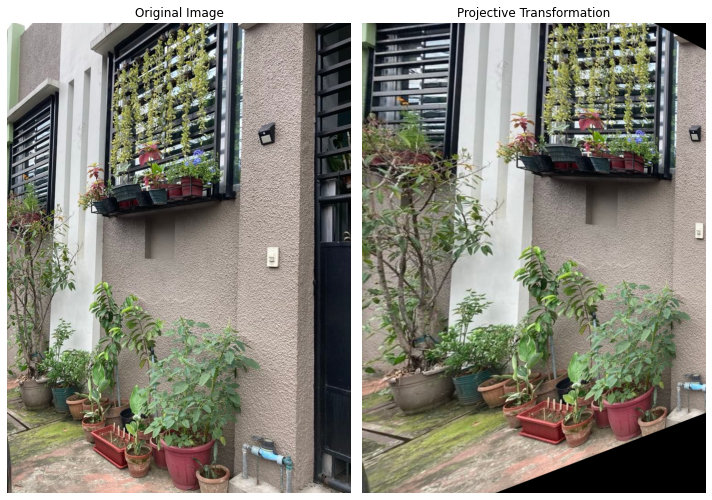

In [656]:
# transform the image
fig, ax = plt.subplots(1, 2, figsize=(10,8))
ax[0].imshow(sample4)

x = [600,0,0,600]
y = [50,300,650,700]
# ax[0].add_patch(Polygon(xy=list(zip(x,y)), fill=False, edgecolor='blue'))
ax[0].set_title('Original Image')
ax[0].axis('off')
x = [749,0,0,749]
y = [100,100,600,600]
# ax[1].imshow(np.zeros((sample4.shape[0], sample4.shape[1])))
# ax[1].add_patch(Polygon(xy=list(zip(x,y)), fill=False, edgecolor='blue'))
# ax[1].set_title('Target')
# # ax[1].axis('off')
plt.tight_layout()

src = np.array([[0, 300,
                600, 50,
                 600, 700,
                 0, 650
                ]]).reshape((4,2))
dst = np.array([[0, 100,
                749,100,
                749,600,
                0,600]]).reshape((4,2))

tform = transform.estimate_transform('projective', src, dst)
tf_img = transform.warp(sample4, tform.inverse)
ax[1].imshow(tf_img)
ax[1].set_title('Projective Transformation')
ax[1].axis('off')
plt.tight_layout()

# Template Matching

## Clementine

In [657]:
music_sheet = imread('Clementine.PNG')
sheet_gray = rgb2gray(music_sheet)

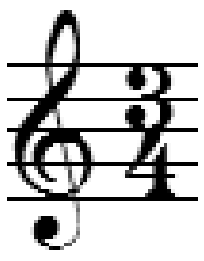

In [658]:
# select reference image
start = sheet_gray[148:213, 50:100]
io.imshow(start);
plt.axis('off');

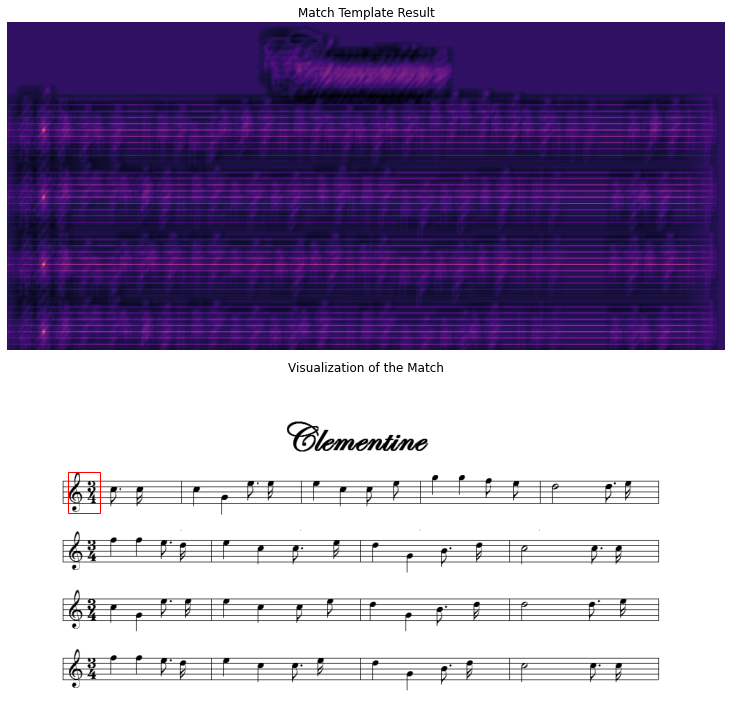

In [659]:
# perform template matching
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
result = match_template(sheet_gray, start)
ax[0].imshow(result, cmap='magma')
ax[0].set_title('Match Template Result')
ax[0].axis('off')
x, y = np.unravel_index(np.argmax(result), result.shape)
template_width, template_height = start.shape
rect = plt.Rectangle((y, x), template_height, template_width, 
                     color='r', fc='none')

ax[1].axis('off')
ax[1].add_patch(rect);
ax[1].imshow(sheet_gray, cmap='gray');
ax[1].set_title('Visualization of the Match')
plt.tight_layout()

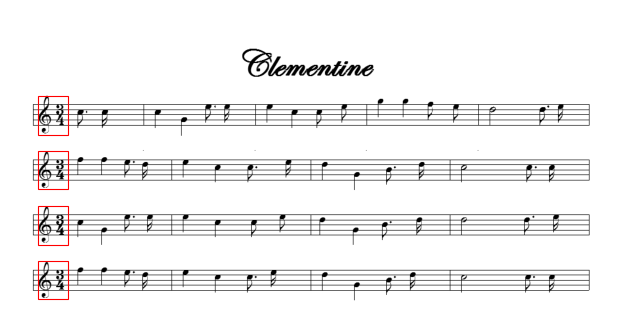

In [660]:
# use peak_local_max
template_width, template_height = start.shape
plt.figure(num=None, figsize=(8, 6), dpi=80)
for x, y in peak_local_max(result, threshold_abs=0.7):
    rect = plt.Rectangle((y, x), template_height, template_width,
                          color='r', fc='none')
    plt.gca().add_patch(rect)
plt.imshow(sheet_gray, cmap='gray');
plt.axis('off')
plt.tight_layout()

## Twinkle

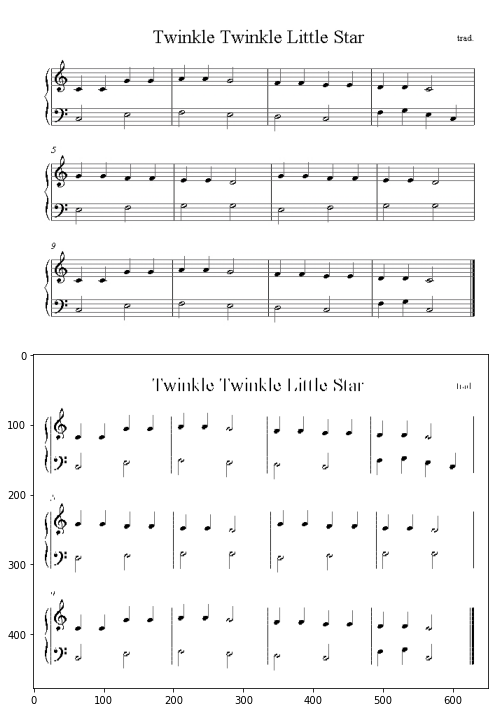

In [671]:
# clean music sheet
music_sheet= imread('sample_images/twinkle.jpg')
fig, ax = plt.subplots(2, 1, figsize=(10,10))
ax[0].imshow(music_sheet,cmap='gray');
ax[0].axis('off');
# get notes only
selem = np.array([[0,1],[0,1]])
notes = closing(rgb2gray(music_sheet), selem)
ax[1].imshow(notes, cmap='gray')
plt.tight_layout()

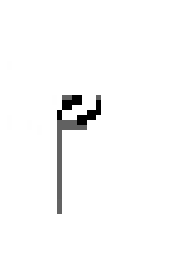

In [684]:
# select reference image
half_note = notes[270:320,50:85]
io.imshow(half_note);
plt.axis('off');

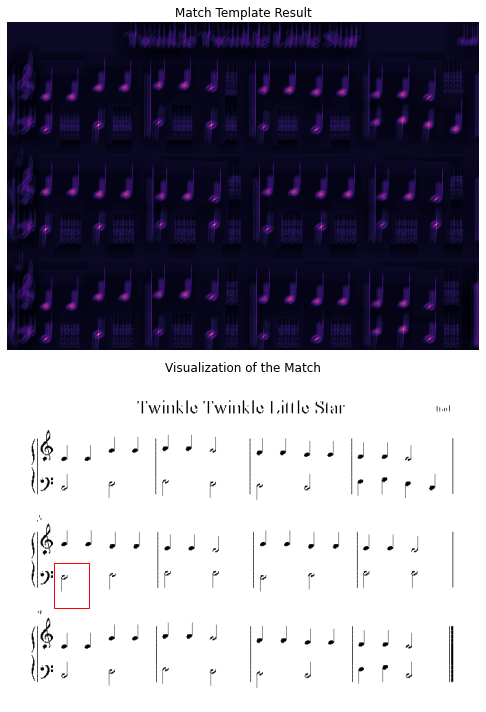

In [687]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
result = match_template(notes, half_note)
ax[0].imshow(result, cmap='magma')
ax[0].set_title('Match Template Result')
ax[0].axis('off')
x, y = np.unravel_index(np.argmax(result), result.shape)
template_width, template_height = start.shape
rect = plt.Rectangle((y, x), template_height, template_width, 
                     color='r', fc='none')

ax[1].axis('off')
ax[1].add_patch(rect);
ax[1].imshow(notes, cmap='gray');
ax[1].set_title('Visualization of the Match')
plt.tight_layout()

In [693]:
template_width, template_height = start.shape
plt.figure(num=None, figsize=(8, 6), dpi=80)
for x, y in peak_local_max(result, threshold_abs=0.676):
    rect = plt.Rectangle((y, x), template_height, template_width,
                          color='r', fc='none')
    plt.gca().add_patch(rect)
plt.imshow(notes, cmap='gray');
plt.axis('off')
plt.tight_layout()

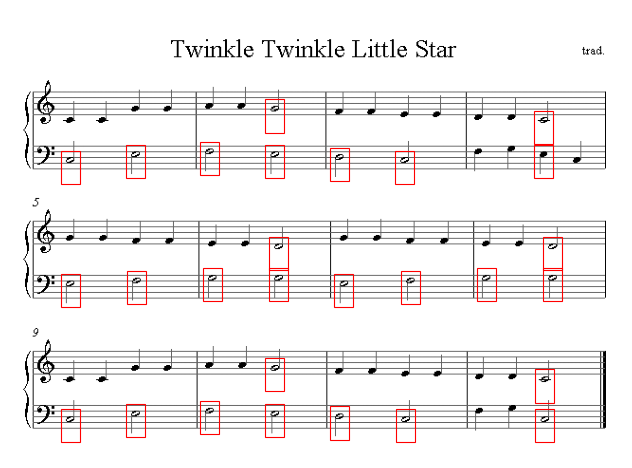

# Leaf Classification

- Kindly refer to leaf classificaiton notebook